In [1]:
# Import necessary libraries
import pandas as pd
import numpy as np
import datetime
from datetime import date 
from datetime import datetime
import scipy.stats
from scipy import stats
from scipy.stats import chi2_contingency, spearmanr
from numpy import array
from numpy import argmax
import math
import time

# For data visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pylab 

# For data transformation
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, QuantileTransformer, RobustScaler, LabelEncoder, OneHotEncoder

# For model building
from prince import FAMD
from sklearn.feature_selection import SelectKBest, f_regression, mutual_info_classif, chi2
from functools import partial
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV, cross_validate, cross_val_predict
from sklearn.metrics import accuracy_score, roc_auc_score, confusion_matrix, mean_squared_error
import sklearn.metrics as sm
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.feature_selection import RFE

# 1. Load data

In [2]:
life_exp_df = pd.read_csv('~/life_expectancy_data.csv')

# 2. Data cleaning

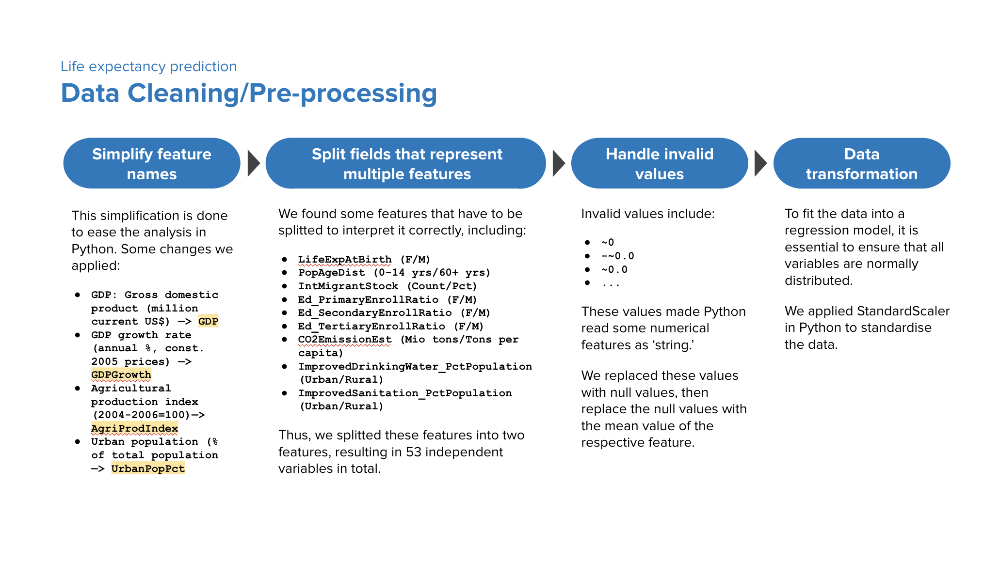

### 2.1. Check for missing values

In [3]:
# Create a function to calculate the percentage of null values in the dataframe
def check_missing_values(df, df_name):
    print(f'Percentage of null values in {df_name}')
    print('-------------------------------------------------------')
    for i, col in df.items():
        count_null = col.isnull()
        percentage_null = round(count_null.sum() * 100.0 / np.shape(df)[0],2)
        print(f'Percentage of null values in column {i} = {percentage_null}%')

In [4]:
check_missing_values(life_exp_df, "Life expectancy dataframe")

Percentage of null values in Life expectancy dataframe
-------------------------------------------------------
Percentage of null values in column Country = 0.0%
Percentage of null values in column Group B life expectancy (years) = 0.0%
Percentage of null values in column Group A life expectancy (years) = 0.0%
Percentage of null values in column Continent = 0.0%
Percentage of null values in column Region = 0.0%
Percentage of null values in column Surface area (km2) = 0.0%
Percentage of null values in column Population in thousands (2017) = 0.0%
Percentage of null values in column Population density (per km2, 2017) = 0.0%
Percentage of null values in column GDP: Gross domestic product (million current US$) = 0.0%
Percentage of null values in column GDP growth rate (annual %, const. 2005 prices) = 0.0%
Percentage of null values in column GDP per capita (current US$) = 0.0%
Percentage of null values in column Economy: Agriculture (% of GVA) = 0.0%
Percentage of null values in column Econo

### 2.2. Simplify the column names

In [5]:
raw_column_list = life_exp_df.columns.tolist()
new_column_list =    ['Country',
                     'GroupB_LifeExp',
                     'GroupA_LifeExp',
                     'Continent',
                     'Region',
                     'Area',
                     'Population',
                     'PopulationDensity',
                     'GDP',
                     'GDPGrowth',
                     'GDPperCapita',
                     'Econ_Agri_PctGVA',
                     'Econ_Ind_PctGVA',
                     'Econ_Serv_PctGVA',
                     'Emp_Agri_PctEmployed',
                     'Emp_Ind_PctEmployed',
                     'Emp_Serv_PctEmployed',
                     'PctUnemployment',
                     'AgriProdIndex',
                     'FoodProdIndex',
                     'IntTrade_Exports',
                     'IntTrade_Imports',
                     'IntTrade_Balance',
                     'BalancePayments',
                     'PopulationGrowth',
                     'UrbanPopPct',
                     'UrbanPopGrowth',
                     'LifeExpAtBirth (F/M)',
                     'PopAgeDist (0-14 yrs/60+ yrs)',
                     'IntMigrantStock (Count/Pct)',
                     'NumRefugees',
                     'InfantMortalityRate',
                     'Health_Expenditure',
                     'Health_NumPhysicians',
                     'Ed_Expenditure',
                     'Ed_PrimaryEnrollRatio (F/M)',
                     'Ed_SecondaryEnrollRatio (F/M)',
                     'Ed_TertiaryEnrollRatio (F/M)',
                     'PctWomeninParliaments',
                     'MobileCellSubs',
                     'InternetPop',
                     'ThreatenedSpecies',
                     'ForestPct',
                     'CO2EmissionEst (Mio tons/Tons per capita)',
                     'EnergyProd',
                     'EnergySup',
                     'ImprovedDrinkingWater_PctPopulation (Urban/Rural)',
                     'ImprovedSanitation_PctPopulation (Urban/Rural)',
                     'ODA_PctGNI']

index=0
for i,col in life_exp_df.items():
    life_exp_df = life_exp_df.rename(columns={raw_column_list[index]:new_column_list[index]})
    index+=1

### 2.3. Replace invalid values with NULL

Note: Invalid values we found in the dataset include `~0.0`, `...`, `-~0.0`, `~0`

In [6]:
def replace_invalid_values_with_null(df, cols_with_invalid_values, invalid_value_list):
    
    target_df = df[cols_with_invalid_values]
    
    for i in list(range(0,len(invalid_value_list))):
        target_df = target_df.replace(invalid_value_list[i], np.nan)
    
    for cols in cols_with_invalid_values:
        df = df.drop(columns={cols})
        
    df = pd.concat([df, target_df], axis=1)
    return df

In [7]:
# Apply the function to replace invalid values with null
cols_with_invalid_values = life_exp_df.select_dtypes(include='object').drop(columns={'Country','Continent','Region'}).columns.tolist()
invalid_value_list = ['~0.0','...','-~0.0','~0']
life_exp_df = replace_invalid_values_with_null(life_exp_df, cols_with_invalid_values, invalid_value_list)

### 2.4. Split columns that represent multiple features/variables

In [8]:
def split_col(df, col, delimiter, new_col_list):
    num_split = len(new_col_list)
    for i in list(range(0,num_split)):
        df[f'{col.split()[0]}_{new_col_list[i]}'] = df[col].str.split(delimiter,expand=True)[i]
    df = df.drop(columns={col})
    return df

In [9]:
# Apply the function to split the columns
life_exp_df = split_col(life_exp_df, 'LifeExpAtBirth (F/M)', '/', ['F','M'])
life_exp_df = split_col(life_exp_df, 'PopAgeDist (0-14 yrs/60+ yrs)', '/', ['0-14yrs','60+yrs'])
life_exp_df = split_col(life_exp_df, 'IntMigrantStock (Count/Pct)', '/', ['Count','Pct'])
life_exp_df = split_col(life_exp_df, 'Ed_PrimaryEnrollRatio (F/M)', '/', ['F','M'])
life_exp_df = split_col(life_exp_df, 'Ed_SecondaryEnrollRatio (F/M)', '/', ['F','M'])
life_exp_df = split_col(life_exp_df, 'Ed_TertiaryEnrollRatio (F/M)', '/', ['F','M'])
life_exp_df = split_col(life_exp_df, 'CO2EmissionEst (Mio tons/Tons per capita)', '/', ['Mio tons','Tons per capita'])
life_exp_df = split_col(life_exp_df, 'ImprovedDrinkingWater_PctPopulation (Urban/Rural)', '/', ['Urban','Rural'])
life_exp_df = split_col(life_exp_df, 'ImprovedSanitation_PctPopulation (Urban/Rural)', '/', ['Urban','Rural'])

### 2.5. Transform `object` to `float`

In [10]:
def tranform_obj_to_float(df, exclude_cols):
    obj_to_float_df = df.select_dtypes(include='object').drop(exclude_cols, axis = 1).astype(float)
    
    obj_to_float_col_list = obj_to_float_df.columns.to_list()
    for col in obj_to_float_col_list:
        df[col] = obj_to_float_df[col]

    return df

In [11]:
# Apply the function to replace invalid values with null
cols_with_invalid_values = life_exp_df.select_dtypes(include='object').drop(columns={'Country','Continent','Region'}).columns.tolist()
invalid_value_list = ['~0.0','...','-~0.0','~0']
life_exp_df = replace_invalid_values_with_null(life_exp_df, cols_with_invalid_values, invalid_value_list)

# Apply the function to tranform object to float
life_exp_df = tranform_obj_to_float(life_exp_df, ['Country','Continent','Region'])

### 2.6. Check for missing values after completing step 2.3, 2.4, and 2.5

In [12]:
check_missing_values(life_exp_df, "Life expectancy dataframe")

Percentage of null values in Life expectancy dataframe
-------------------------------------------------------
Percentage of null values in column Country = 0.0%
Percentage of null values in column GroupB_LifeExp = 0.0%
Percentage of null values in column GroupA_LifeExp = 0.0%
Percentage of null values in column Continent = 0.0%
Percentage of null values in column Region = 0.0%
Percentage of null values in column Area = 0.0%
Percentage of null values in column Population = 0.0%
Percentage of null values in column PopulationDensity = 0.0%
Percentage of null values in column GDP = 0.0%
Percentage of null values in column GDPperCapita = 0.0%
Percentage of null values in column Econ_Ind_PctGVA = 0.0%
Percentage of null values in column Econ_Serv_PctGVA = 0.0%
Percentage of null values in column AgriProdIndex = 0.0%
Percentage of null values in column FoodProdIndex = 0.0%
Percentage of null values in column IntTrade_Imports = 0.0%
Percentage of null values in column IntTrade_Balance = 0.0%


### 2.7. Replace missing values with the mean value of the respective field

In [13]:
def get_cols_with_missing_values(df):
    col_list = []
    for i, col in df.items():
        count_null = col.isnull()
        percentage_null = count_null.sum() * 100.0 / np.shape(df)[0]
        if percentage_null > 0:
            col_list.append(i)
    return col_list

In [14]:
def replace_mising_value_with_mean(feature):
    mean = feature.mean()
    new_value_list = []
    for i, col in feature.items():
        if str(col) == 'nan':
            new_value_list.append(mean)
        else:
            new_value_list.append(col)
    return new_value_list

In [15]:
# Apply the function to replace missing values with the mean value of the respective feature
features_w_missing_values = get_cols_with_missing_values(life_exp_df)
for feature in features_w_missing_values:
    life_exp_df[feature] = replace_mising_value_with_mean(life_exp_df[feature])

### 2.8. Ensure that there is no missing values anymore

In [16]:
check_missing_values(life_exp_df, "Life expectancy dataframe")

Percentage of null values in Life expectancy dataframe
-------------------------------------------------------
Percentage of null values in column Country = 0.0%
Percentage of null values in column GroupB_LifeExp = 0.0%
Percentage of null values in column GroupA_LifeExp = 0.0%
Percentage of null values in column Continent = 0.0%
Percentage of null values in column Region = 0.0%
Percentage of null values in column Area = 0.0%
Percentage of null values in column Population = 0.0%
Percentage of null values in column PopulationDensity = 0.0%
Percentage of null values in column GDP = 0.0%
Percentage of null values in column GDPperCapita = 0.0%
Percentage of null values in column Econ_Ind_PctGVA = 0.0%
Percentage of null values in column Econ_Serv_PctGVA = 0.0%
Percentage of null values in column AgriProdIndex = 0.0%
Percentage of null values in column FoodProdIndex = 0.0%
Percentage of null values in column IntTrade_Imports = 0.0%
Percentage of null values in column IntTrade_Balance = 0.0%


# 3. Exploratory Data Analysis

### 3.1. How life expectancy varies between groups and countries

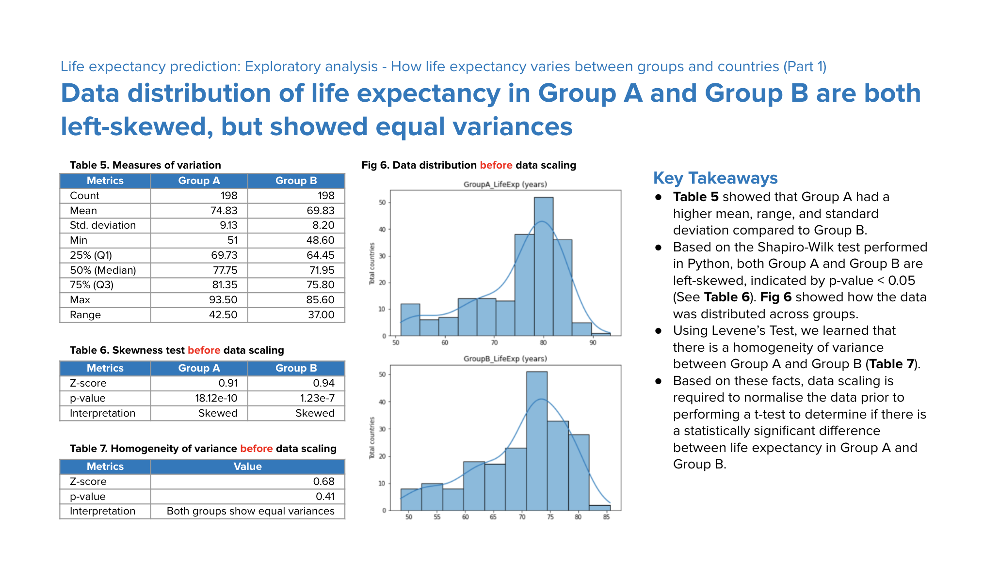

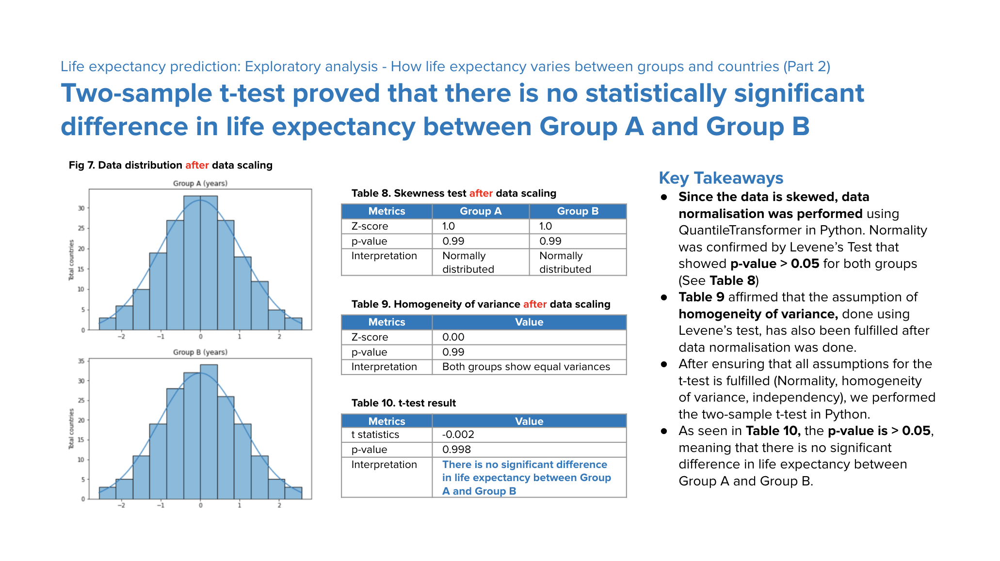

In [17]:
# Step 1: Normality test

# Visualise distribution
def get_histplot(df, title):
    num_features = len(df.columns.to_list())
    fig, ax = plt.subplots(ncols=1, nrows=2, figsize=(7,10))
    index = 0
    ax = ax.flatten()
    fig.suptitle(title, fontfamily='arial', fontsize=16, y=0.95, fontweight='bold')
    for i, col in dependent_var_df.items():
        sns.histplot(col, ax=ax[index], color="#007ABF", kde=True).set(title=i+' (years)', xlabel=None, ylabel='Total countries') 
        index += 1
        
# Skewness test
def get_skewness_test(col, col_name):
    stat, pvalue = stats.shapiro(col)
    stat = round(stat,2)
    print(f'{col_name} skewness test result: Z-score={stat}, p-value={pvalue}')
    
# Visualise Q-Q plot
def get_qqplot(series, title):
    data = series.to_numpy()  
    stats.probplot(data, dist="norm", plot=pylab)
    plt.title(title)
    pylab.show()

In [18]:
# Step 2: Handle skewed data

# Create a function to scale the data
def get_scaled_data(df, col_name, n_quantiles):
    col_transform = ColumnTransformer([('somename', QuantileTransformer(n_quantiles=n_quantiles, output_distribution='normal'), [col_name])])
    df[f'{col_name}_scaled'] = col_transform.fit_transform(df)
    return df

# Create a function to remove outliers (If any)
def remove_outliers(df, column):
    for i, col in df[column].items():
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        upper_fence = Q3 + 1.5 * IQR
        lower_fence = Q1 - 1.5 * IQR
        df = df[(df[column] >= lower_fence) & (df[column] <= upper_fence)].reset_index().drop(columns={'index'})
    return df

In [19]:
# Step 3: Homogenity of variance testing

# Calculate variance of a given group
def get_variance(data, ddof=0):
    n = len(data)
    mean = sum(data) / n
    return round(sum((x - mean) ** 2 for x in data) / (n - ddof),2)

# Perform Levene's test of homogenity of variance
def get_levene_test(x,y):
    zscore, pvalue=stats.levene(x, y, center='median') 
    zscore=round(zscore,2)
    print(f'Levene test for homogenity of variance: z-score={zscore}, p-value={pvalue}')

In [20]:
# Step 4: Perform t-test
def get_ttest(x, y):
    result=stats.ttest_ind(x, y)
    print(result)

In [21]:
# Compute measures of variance for both groups
life_exp_df[['GroupA_LifeExp','GroupB_LifeExp']].describe()

,GroupA_LifeExp,GroupB_LifeExp
count,198.000000,198.000000
mean,74.832323,69.833333
std,9.127382,8.202847
min,51.000000,48.600000
25%,69.725000,64.450000
50%,77.750000,71.950000
75%,81.350000,75.800000
max,93.500000,85.600000


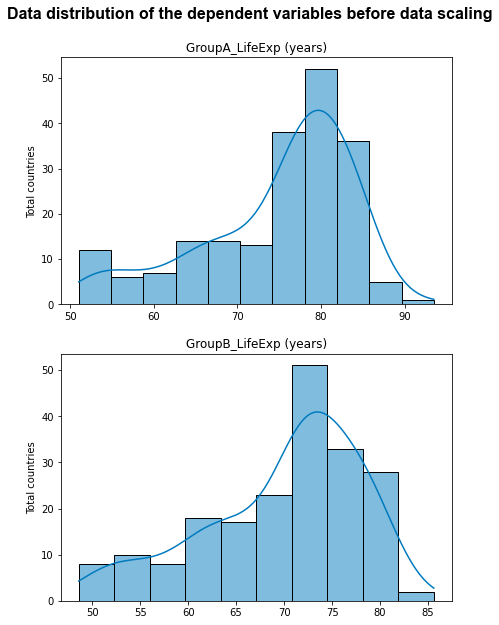

In [22]:
# Apply the function to visualise data distribution
dependent_var_df = life_exp_df[['GroupA_LifeExp','GroupB_LifeExp']]
get_histplot(dependent_var_df, 'Data distribution of the dependent variables before data scaling')

In [23]:
# Apply the function for skewness test
get_skewness_test(life_exp_df['GroupA_LifeExp'], 'Group A')
get_skewness_test(life_exp_df['GroupB_LifeExp'], 'Group B')

Group A skewness test result: Z-score=0.91, p-value=8.122698624823954e-10
Group B skewness test result: Z-score=0.94, p-value=1.2331001641996409e-07


In [24]:
# Apply the function to test the homogenity of variance
get_levene_test(life_exp_df['GroupA_LifeExp'], life_exp_df['GroupB_LifeExp'])

Levene test for homogenity of variance: z-score=0.68, p-value=0.4100725278053229


At this point, we learned that the data is skewed. Therefore, data scaling was performed to fit the regression model

In [25]:
# Create a function to scale the data
def get_scaled_data(df, col_name):
    col_transform = ColumnTransformer([('somename', QuantileTransformer(n_quantiles=len(df), output_distribution='normal'), [col_name])])
    df[f'{col_name}_scaled'] = col_transform.fit_transform(df)
    return df

In [26]:
# Apply the function for data scaling
GroupA_LifeExp_df = life_exp_df[['GroupA_LifeExp']].rename(columns={'GroupA_LifeExp':'LifeExp'})
GroupB_LifeExp_df = life_exp_df[['GroupB_LifeExp']].rename(columns={'GroupB_LifeExp':'LifeExp'})
GroupA_LifeExp_df = get_scaled_data(GroupA_LifeExp_df, 'LifeExp')
GroupB_LifeExp_df = get_scaled_data(GroupB_LifeExp_df, 'LifeExp')

In [27]:
# Apply the function to remove outliers
GroupA_LifeExp_df = remove_outliers(GroupA_LifeExp_df, 'LifeExp_scaled')
GroupB_LifeExp_df= remove_outliers(GroupB_LifeExp_df, 'LifeExp_scaled')

In [28]:
# Combine the scaled data into a single dataframe
GroupA_LifeExp_df['Group'] = 'Group A'
GroupB_LifeExp_df['Group'] = 'Group B'
ScaledLifeExp_df = pd.concat([GroupA_LifeExp_df, GroupB_LifeExp_df])
ScaledLifeExp_df = ScaledLifeExp_df.pivot(columns='Group', values='LifeExp_scaled')

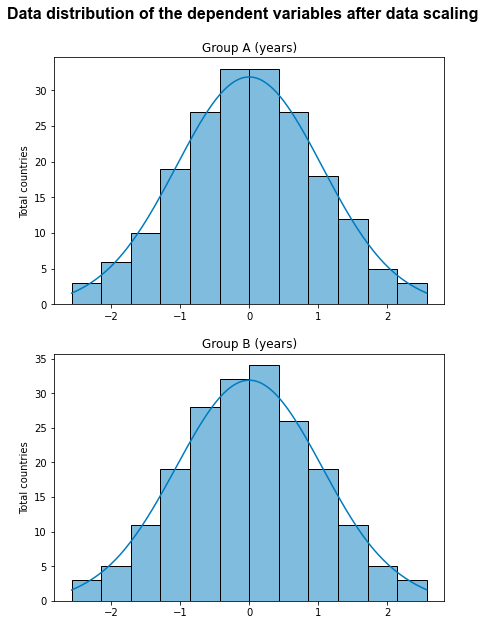

In [29]:
# Apply the function to visualise data distribution after scaling
dependent_var_df = ScaledLifeExp_df[['Group A','Group B']]
get_histplot(dependent_var_df, 'Data distribution of the dependent variables after data scaling')

In [30]:
# Apply the function for skewness test of the data after scaling
get_skewness_test(ScaledLifeExp_df['Group A'], 'Group A')
get_skewness_test(ScaledLifeExp_df['Group B'], 'Group B')

Group A skewness test result: Z-score=1.0, p-value=0.9998931288719177
Group B skewness test result: Z-score=1.0, p-value=0.9998867511749268


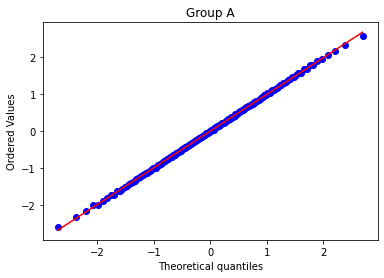

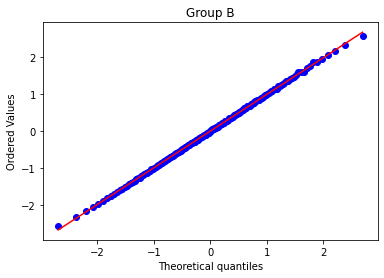

In [31]:
# Visualise QQ-plot for normality test
get_qqplot(ScaledLifeExp_df['Group A'], 'Group A')
get_qqplot(ScaledLifeExp_df['Group B'], 'Group B')

In [32]:
get_levene_test(ScaledLifeExp_df['Group A'], ScaledLifeExp_df['Group B'])

Levene test for homogenity of variance: z-score=0.0, p-value=0.9936046181367636


In [33]:
# Perform t-test
get_ttest(ScaledLifeExp_df['Group A'], ScaledLifeExp_df['Group B'])

Ttest_indResult(statistic=-0.0023837755764510543, pvalue=0.9980992429003526)


Based on the skewness test, QQ plot, and levene test, we have ensured that the data is now normally distributed.

### 3.2. Data distribution of each feature (independent variable)

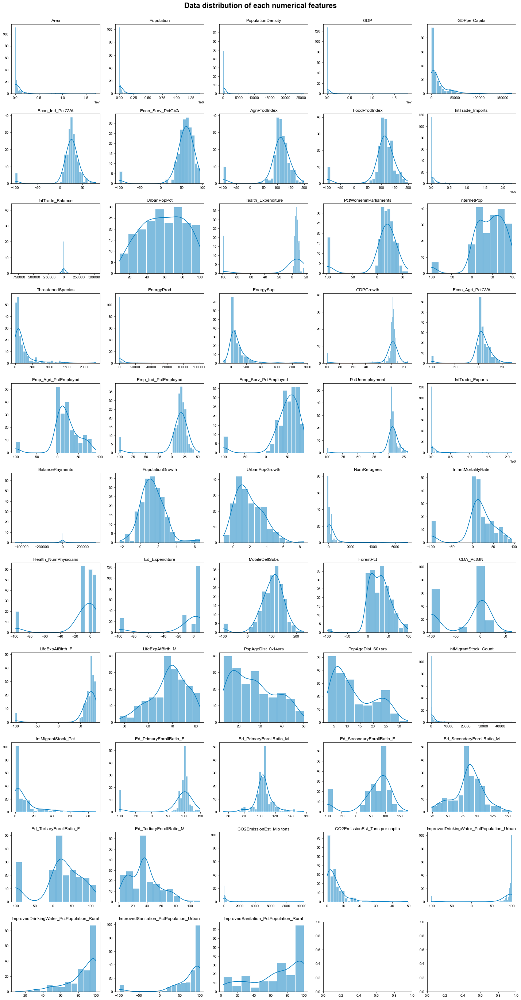

In [34]:
numerical_features_df = life_exp_df.select_dtypes(exclude='object').drop(['GroupA_LifeExp','GroupB_LifeExp'],axis=1)
num_features = len(numerical_features_df.columns.to_list())
ncols = 5
nrows = int(num_features/ncols)+1
figsize_length = int(ncols*4)
figsize_width = int(nrows*3.5)

fig, ax = plt.subplots(ncols=ncols, nrows=nrows, figsize=(figsize_length, figsize_width))
fig.suptitle('Data distribution of each numerical features', fontfamily='arial', fontsize=20, y=1, fontweight='bold')
index = 0
ax = ax.flatten()

sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
for i, col in numerical_features_df.items():
    sns.histplot(col, ax=ax[index], color="#007ABF", kde=True).set(title=i, xlabel=None, ylabel=None) 
    #sns.set(rc={'figure.facecolor':'white'})
    index += 1
    
plt.tight_layout()
plt.show()

### 3.3. Relationship between categorical variables and dependent variables

In [35]:
def get_spearman_corr(x, y):
    coefficient, pvalue = spearmanr(x, y)
    print(f'\033[1m' + f'Spearmans correlation between {x.name} and {y.name}' + '\033[0m')
    print(f'Spearmans correlation coefficient:{coefficient}')
    
    alpha = 0.05

    if pvalue > alpha:
        print(f'Samples are uncorrelated (Fail to reject H0) with p-value={pvalue}')
    else:
        print(f'Samples are correlated (Reject H0) with p-value={pvalue}')

In [36]:
get_spearman_corr(life_exp_df['Continent'], life_exp_df['GroupA_LifeExp'])
print('\n')
get_spearman_corr(life_exp_df['Region'], life_exp_df['GroupA_LifeExp'])
print('\n')
get_spearman_corr(life_exp_df['Continent'], life_exp_df['GroupB_LifeExp'])
print('\n')
get_spearman_corr(life_exp_df['Region'], life_exp_df['GroupB_LifeExp'])

Spearmans correlation between Continent and GroupA_LifeExp
Spearmans correlation coefficient:0.5032692732020948
Samples are correlated (Reject H0) with p-value=4.136931758260726e-14


Spearmans correlation between Region and GroupA_LifeExp
Spearmans correlation coefficient:0.10868688323529174
Samples are uncorrelated (Fail to reject H0) with p-value=0.12745986313171925


Spearmans correlation between Continent and GroupB_LifeExp
Spearmans correlation coefficient:0.4935171757445831
Samples are correlated (Reject H0) with p-value=1.4973865343280833e-13


Spearmans correlation between Region and GroupB_LifeExp
Spearmans correlation coefficient:0.12175246443054234
Samples are uncorrelated (Fail to reject H0) with p-value=0.08750200434338248


# 4. Feature transformation

### 4.1. Normalise continuous variables

In [39]:
# Perform normalisation
data_to_scale = numerical_features_df
column_list = numerical_features_df.columns.to_list()

column_tranform = ColumnTransformer([('somename', StandardScaler(), column_list)], remainder='passthrough')
column_tranform.fit(data_to_scale)

scaled_result = column_tranform.transform(data_to_scale)
numerical_features_scaled = numerical_features_df.copy()
numerical_features_scaled[column_list] = scaled_result

# Append target variables into the dataframe
numerical_features_scaled = pd.concat([life_exp_df[['GroupA_LifeExp','GroupB_LifeExp']], numerical_features_scaled], axis=1)

### 4.2. Correlation analysis between continuous independent variables and dependent variables

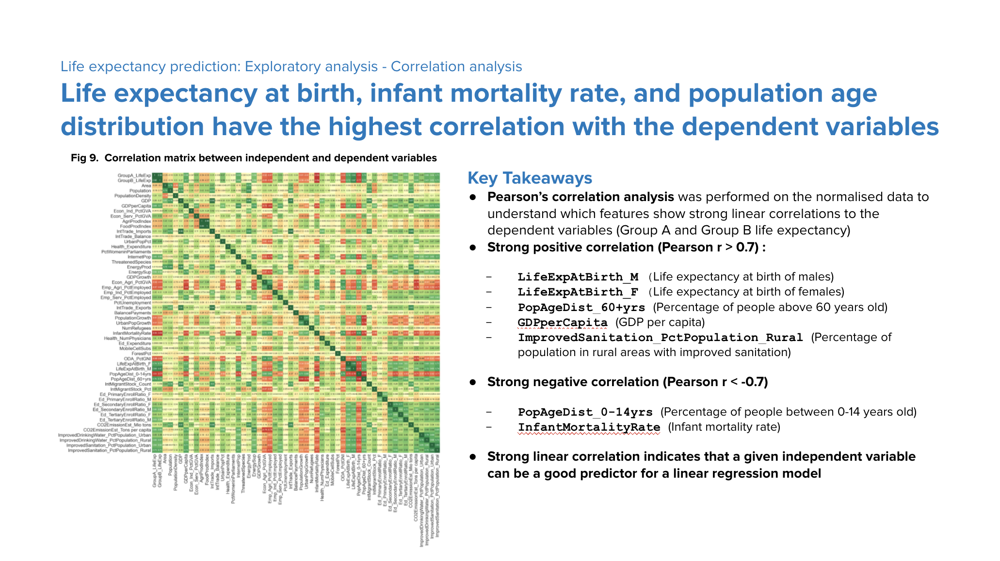

In [40]:
def get_corr_matrix(df):
    corr_df = df.select_dtypes(include=['int64','float64'])
    sns.set(font_scale=4)
    plt.figure(figsize=(50, 50))
    sns.heatmap(corr_df.corr(), vmin=-1, vmax= 1, cmap="RdYlGn", annot=True, annot_kws={"size":20}, cbar=False).set_title('Correlation matrix between continuous independent variables and dependent variables',y=1.02,fontsize=60,fontweight='bold')
    yticklabels=False
    plt.show()

'InfantMortalityRate',
'LifeExpAtBirth_F',
'LifeExpAtBirth_M',
'PopAgeDist_0-14yrs',
'PopAgeDist_60+yrs',
'ImprovedSanitation_PctPopulation_Rural'

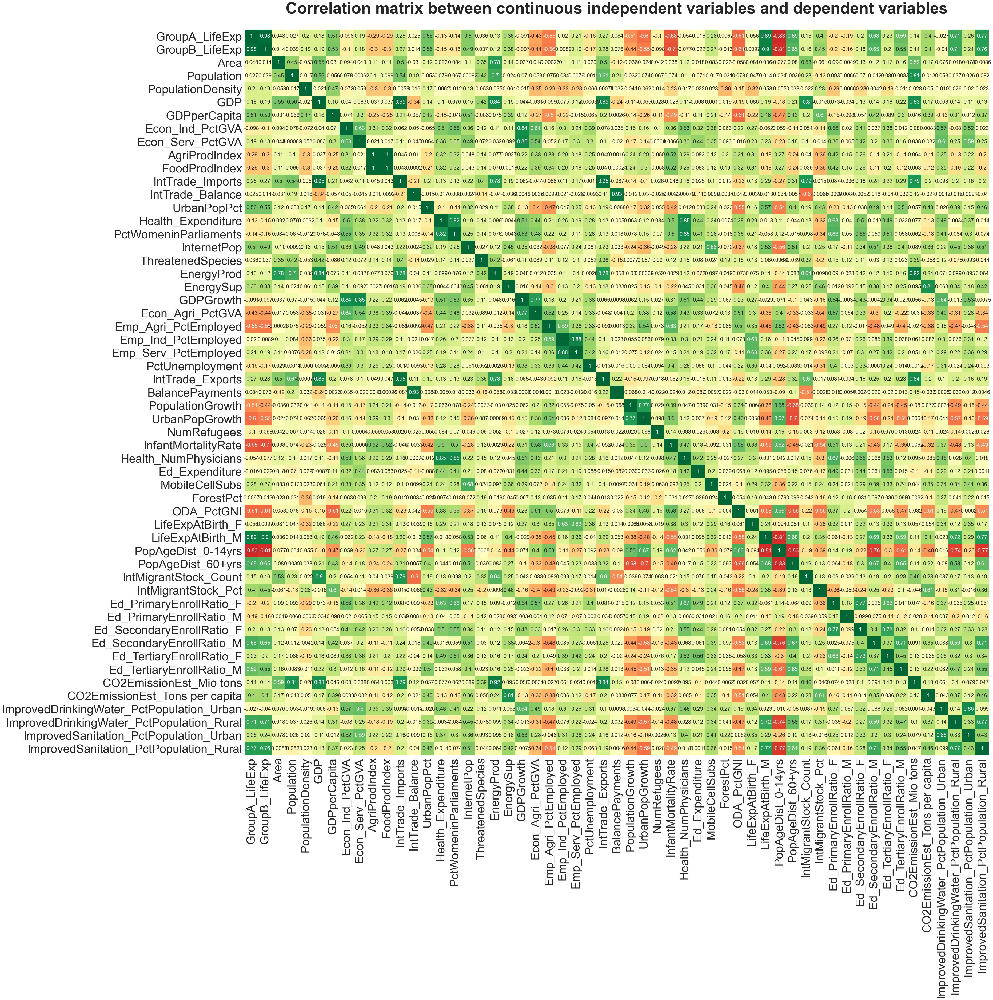

In [41]:
get_corr_matrix(numerical_features_scaled)

### 4.3. Transform categorical variables into dummy variables

In [42]:
def get_dummy_var(col):
    # Transform dataframe into arrays
    array_to_encode = array(col)
    
    # Fit encoder into the array
    label_encoder = LabelEncoder()
    integer_encoded = label_encoder.fit_transform(array_to_encode)
    onehot_encoder = OneHotEncoder(sparse=False)
    integer_encoded = integer_encoded.reshape(len(integer_encoded), 1)
    onehot_encoded = onehot_encoder.fit_transform(integer_encoded)
    
    result_df = pd.DataFrame(data=onehot_encoded, columns=list(set(array_to_encode)))
    result_df = result_df.astype('int').astype('str')
    return result_df

In [43]:
# Apply the function to encode categorical variables
to_encode_df = life_exp_df.select_dtypes(include=['object']).drop(['Country'], axis=1)
encoded_categorical_var_df = pd.DataFrame()
col_list = to_encode_df.columns
for col in col_list:
    encoded_categorical_var_df =pd.concat([encoded_categorical_var_df , get_dummy_var(to_encode_df[col])], axis=1)

# 5. Data splitting

In [44]:
# Split data without categorical variables
y = numerical_features_scaled['GroupA_LifeExp']
X = numerical_features_scaled.drop(['GroupA_LifeExp','GroupB_LifeExp'], axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# 6. Model building with Grid Search CV

In [45]:
def run_gridsearchCV(model, model_name, fignum, X_train, y_train, X_test, y_test):
    start_time = time.time()
    
    # Step 1: Create a cross validation scheme
    kfold = KFold(n_splits = 5, shuffle = True, random_state = 42)
    
    # Step 2: Specify range of number of features to tune
    hyper_params = [{'n_features_to_select': list(range(1, len(set(X_train))))}]
    
    # Step 3: Run the model alongside GridSearchSV for hyperparameter tuning
    model = model
    model.fit(X_train, y_train)
    rfe = RFE(model)  
    grid_cv = GridSearchCV(estimator = rfe, 
                         param_grid = hyper_params, 
                         scoring= 'neg_mean_squared_error', 
                         cv = kfold, 
                         verbose = 1,
                         return_train_score=True) 
    
    # Step 4: Fit the model
    grid_cv.fit(X_train, y_train)    
    y_pred = grid_cv.best_estimator_.predict(X_test)
    
    # Step 5: Evaluate the model
    print('\n')
    print('\033[1m' + f'{model_name} results:' + '\033[0m')
    cpu_time = round(time.time() - start_time, 2)
    print(f'CPU time: {cpu_time} seconds')

    # Evaluate the model
    best_params = grid_cv.best_params_
    print(f'Best estimator: {best_params}')
    
    MAE = sm.mean_absolute_error(y_test, y_pred)
    MSE = sm.mean_squared_error(y_test, y_pred)
    RMSE = math.sqrt(MSE)
    r2 = sm.r2_score(y_test, y_pred)

    print(f'MAE: {MAE}')
    print(f'MSE: {MSE}')
    print(f'RMSE: {RMSE}')
    print(f'R-squared: {r2}') 
    
    # Visualise optimal number of features
    cv_results = pd.DataFrame(grid_cv.cv_results_)

    
    plt.figure(figsize=(7,6))
    sns.set(font_scale=1)
    sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
    plt.plot(cv_results['param_n_features_to_select'], cv_results['mean_test_score'], color='dodgerblue', linewidth=3)
    plt.plot(cv_results['param_n_features_to_select'], cv_results['mean_train_score'], color='yellowgreen', linewidth=3)
    plt.xlabel('Number of features', fontfamily='arial')
    plt.ylabel('R-squared', fontfamily='arial')
    plt.title(f'{fignum}. {model_name} optimal number of features by R-squared', fontfamily='arial', fontsize=16, fontweight='bold')
    plt.legend(['Test score', 'Train score'], loc='lower right')
    
    return best_params.get('n_features_to_select')

In [46]:
def run_final_model(model, model_name, fignum1, fignum2, X_train, y_train, X_test, y_test, n_features=10):
    rfe = RFE(estimator=model, n_features_to_select=n_features)
    rfe.fit(X_train, y_train)
    y_pred = rfe.predict(X_test)
    r2 = sm.r2_score(y_test, y_pred)
    
    result_df = pd.DataFrame()
    result_df['y_pred'] = y_pred.tolist()
    result_df['y_true'] = y_test.to_list()
    
    # Visualise model results
    plt.figure(figsize=(8,6))
    sns.set(font_scale=1)
    sns.set(rc={'axes.facecolor':'white', 'figure.facecolor':'white'})
    plt.plot(result_df['y_true'], result_df['y_true'], color='yellowgreen', linewidth=1)
    plt.scatter(data=result_df, x='y_true', y='y_pred', color='dodgerblue', s=100)
    plt.title(f'{fignum1}. {model_name} result - y predicted vs y true', fontsize=16, fontfamily='arial', fontweight='bold')
    plt.xlabel('y true', fontfamily='arial', fontsize=14)
    plt.ylabel('y predicted', fontfamily='arial', fontsize=14)
    plt.show()
    
    # Show selected features
    selected_features_list = []
    for i in range(X_train.shape[1]):
        if rfe.support_[i] == True:
            selected_features_list.append(X_train.columns.tolist()[i])
        else:
            pass
    
    importance = rfe.estimator_.coef_
    feature_importance_df = pd.DataFrame()
    feature_importance_df['Feature name'] = selected_features_list
    feature_importance_df['Coefficient'] = [v for i,v in enumerate(importance)]
    feature_importance_df = feature_importance_df.sort_values('Coefficient', ascending=False)
    
    plt.figure(figsize=(3,6))
    ax = sns.barplot(data=feature_importance_df, x='Coefficient', y='Feature name', color='dodgerblue')
    plt.title(f'{fignum2}. {model_name} result - Feature importance by coefficient', fontsize=16, fontfamily='arial', fontweight='bold')
    plt.yticks(fontsize=14)
    plt.ylabel(None)
    plt.show()
    
    return feature_importance_df.reset_index(drop=True)

### 6.1. Linear Regression

Fitting 5 folds for each of 52 candidates, totalling 260 fits


Linear regression results:
CPU time: 4.81 seconds
Best estimator: {'n_features_to_select': 7}
MAE: 2.765958708840947
MSE: 15.322055487536865
RMSE: 3.914339725616169
R-squared: 0.7762608755387981


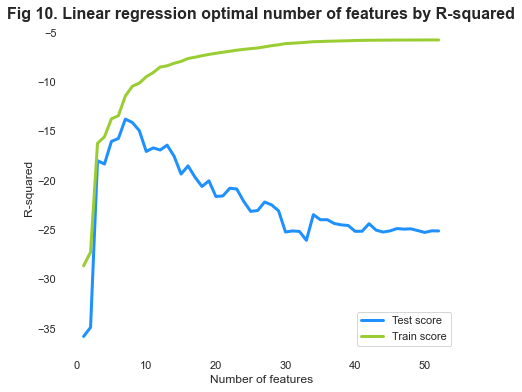

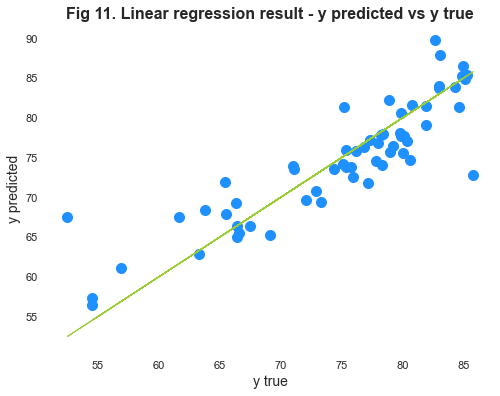

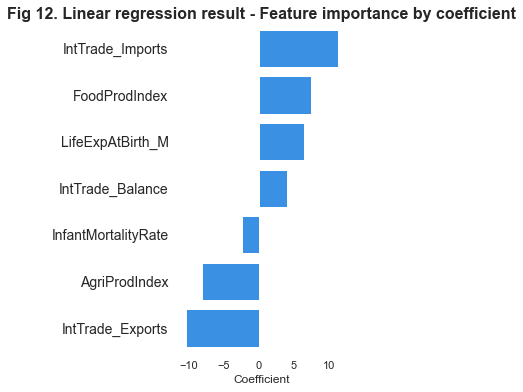

,Feature name,Coefficient
0,IntTrade_Imports,11.249063
1,FoodProdIndex,7.472225
2,LifeExpAtBirth_M,6.426254
3,IntTrade_Balance,4.035799
4,InfantMortalityRate,-2.447913
5,AgriProdIndex,-8.055110
6,IntTrade_Exports,-10.449152


In [47]:
num_feat=run_gridsearchCV(LinearRegression(), 'Linear regression', 'Fig 10', X_train, y_train, X_test, y_test)
run_final_model(LinearRegression(), 'Linear regression', 'Fig 11', 'Fig 12', X_train, y_train, X_test, y_test, n_features=num_feat)

### 6.2. Ridge Regression

Fitting 5 folds for each of 52 candidates, totalling 260 fits


Ridge regression results:
CPU time: 3.03 seconds
Best estimator: {'n_features_to_select': 5}
MAE: 2.7249963658956053
MSE: 15.11732189257199
RMSE: 3.888100036338056
R-squared: 0.77925048194784


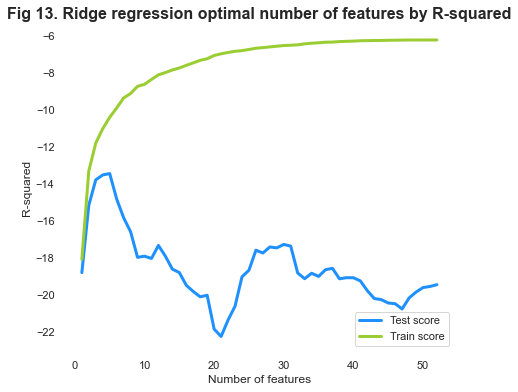

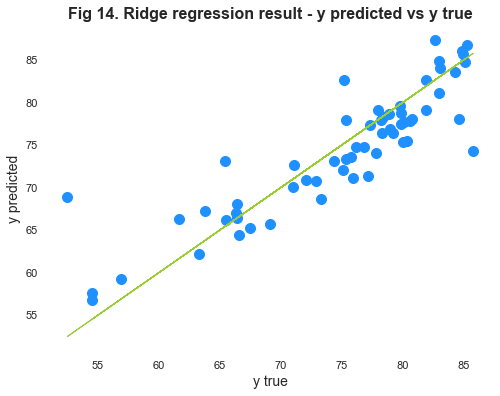

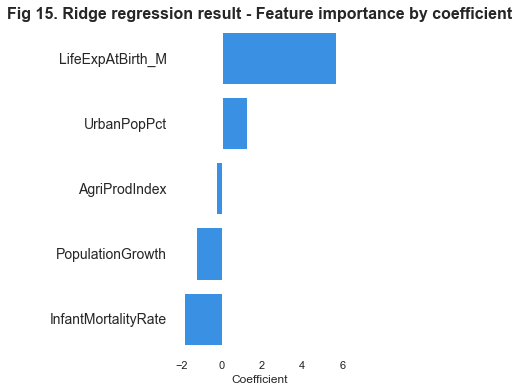

,Feature name,Coefficient
0,LifeExpAtBirth_M,5.668941
1,UrbanPopPct,1.254303
2,AgriProdIndex,-0.268547
3,PopulationGrowth,-1.262232
4,InfantMortalityRate,-1.876987


In [48]:
num_feat=run_gridsearchCV(Ridge(), 'Ridge regression', 'Fig 13', X_train, y_train, X_test, y_test)
run_final_model(Ridge(), 'Ridge regression', 'Fig 14', 'Fig 15', X_train, y_train, X_test, y_test, n_features=num_feat)

### 6.3. Lasso Regression

Fitting 5 folds for each of 52 candidates, totalling 260 fits


Lasso regression results:
CPU time: 4.56 seconds
Best estimator: {'n_features_to_select': 5}
MAE: 2.6033591318104894
MSE: 14.117773158600823
RMSE: 3.75736252690645
R-squared: 0.7938463146529833


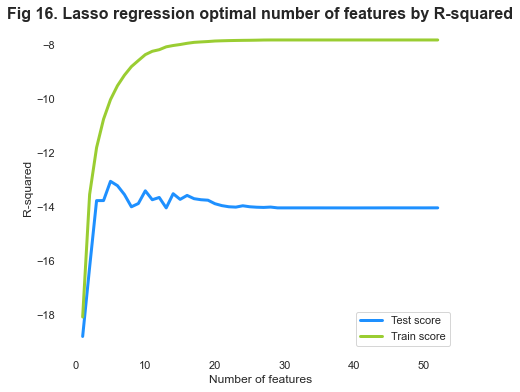

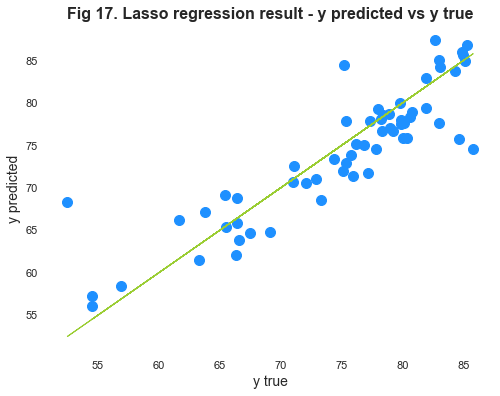

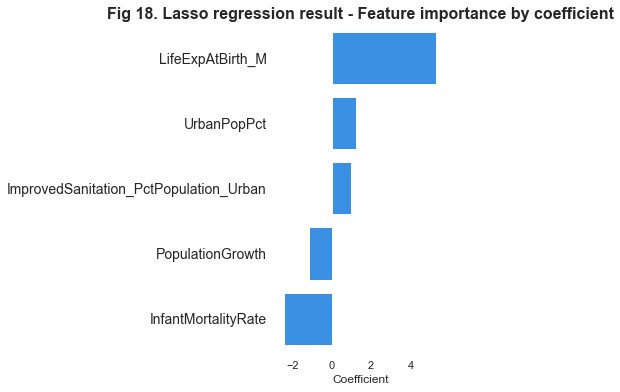

,Feature name,Coefficient
0,LifeExpAtBirth_M,5.296476
1,UrbanPopPct,1.234896
2,ImprovedSanitation_PctPopulation_Urban,1.000955
3,PopulationGrowth,-1.146764
4,InfantMortalityRate,-2.411584


In [49]:
num_feat=run_gridsearchCV(Lasso(alpha=0.1), 'Lasso regression', 'Fig 16', X_train, y_train, X_test, y_test)
run_final_model(Lasso(alpha=0.01), 'Lasso regression', 'Fig 17', 'Fig 18', X_train, y_train, X_test, y_test, n_features=num_feat)

# 7. Conclusion

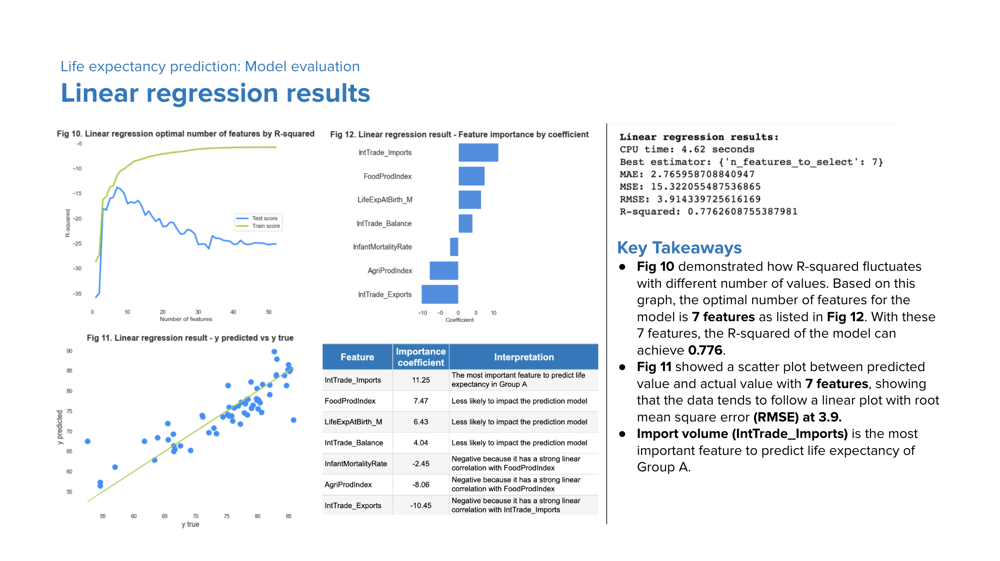

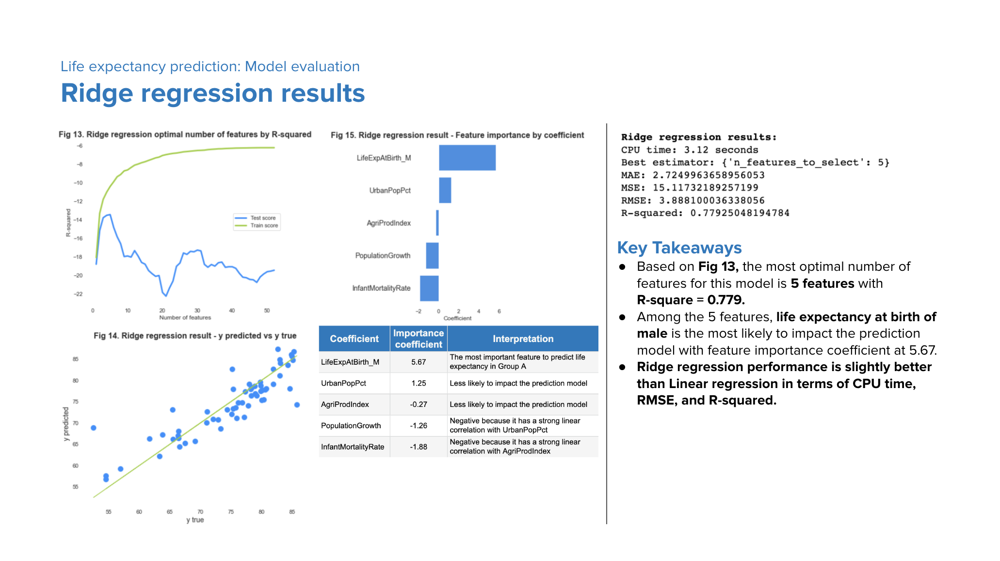

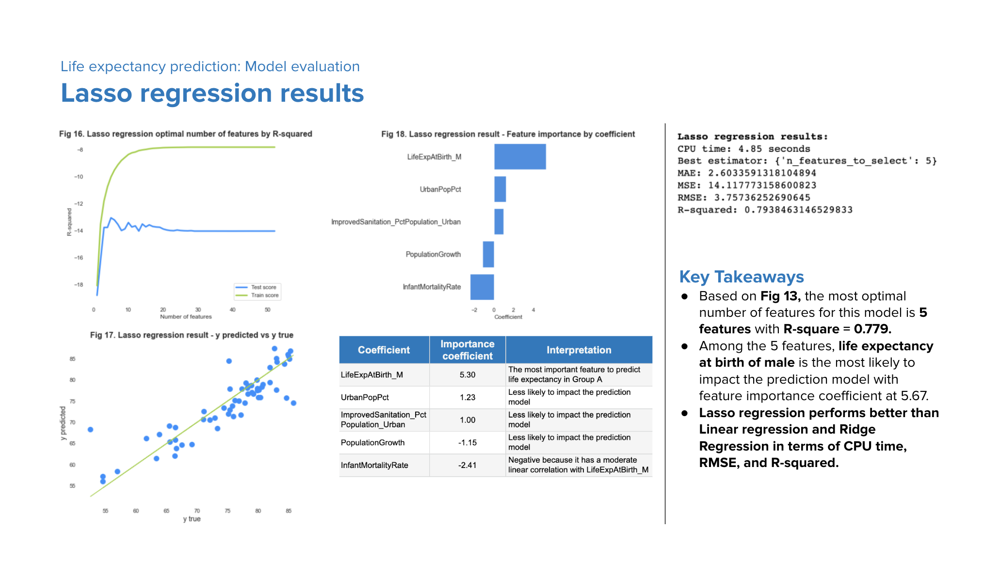

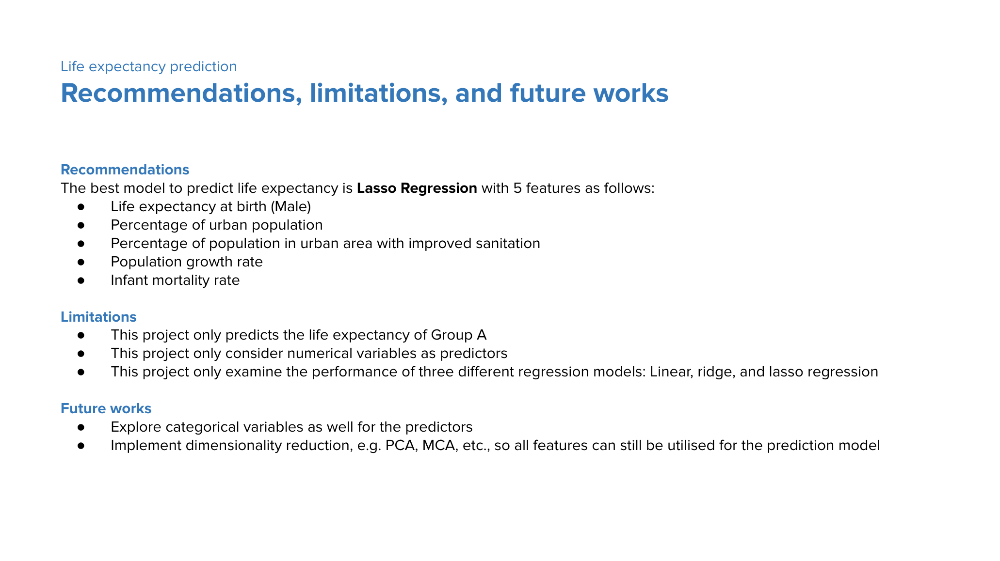